In [2]:
import os
import re
import time
import spotipy
import numpy as np
import pandas as pd
import altair as alt
import seaborn as sns
import umap.umap_ as umap
import plotly.express as px
import matplotlib.pyplot as plt

from tqdm import tqdm
from scipy.special import comb
from sklearn.manifold import MDS
from sklearn.manifold import TSNE
from sklearn.cluster import Birch
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import OPTICS
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import AffinityPropagation
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from spotipy.oauth2 import SpotifyClientCredentials, SpotifyOAuth

import warnings
warnings.filterwarnings("ignore")

In [3]:
## Functions helping to count how many songs are there in the dataframe for each genre and 
## another one to balance data
def song_count(df):
    grouped_df = df.groupby('song_genre').count().reset_index()
    grouped_df
    totals = list(zip(grouped_df['song_genre'], grouped_df[grouped_df.columns[1]]))
    for genre, count in totals:
        print(genre,count)
    print('Total songs: {}'.format(len(df)))

def balance_data(df):
    grouped_df = df.groupby(['song_genre']).count()
    min_songs = min(grouped_df[grouped_df.columns[0]])
    min_genre = grouped_df[grouped_df.columns[0]][grouped_df[grouped_df.columns[0]] == min_songs].index.tolist()
    return df.groupby('song_genre').head(min_songs)

def rand_index_score(clusters, classes):
    tp_plus_fp = comb(np.bincount(clusters), 2).sum()
    tp_plus_fn = comb(np.bincount(classes), 2).sum()
    A = np.c_[(clusters, classes)]
    tp = sum(comb(np.bincount(A[A[:, 0] == i, 1]), 2).sum()
             for i in set(clusters))
    fp = tp_plus_fp - tp
    fn = tp_plus_fn - tp
    tn = comb(len(A), 2) - tp - fp - fn
    return (tp + tn) / (tp + fp + fn + tn)
    

In [4]:
# Documentation:
# Client credentials:
#   https://developer.spotify.com/documentation/general/guides/app-settings/#register-your-app
#
# What each audio features means:
#   https://developer.spotify.com/documentation/web-api/reference/#object-audiofeaturesobject
#   https://medium.com/@FinchMF/praise-questions-and-critique-spotify-api-38e984a4174b
# LUFS (Loudness):
#   https://www.sweetwater.com/insync/what-is-lufs-and-why-should-i-care/
# Scopes:
#   https://developer.spotify.com/documentation/general/guides/scopes/#user-library-read


# Examples:
#   https://www.researchgate.net/profile/Scott-Wolf/publication/342854806_Just_the_Way_You_Are_Linking_Music_Listening_on_Spotify_and_Personality/links/5f0bc62a92851c52d62f8a3a/Just-the-Way-You-Are-Linking-Music-Listening-on-Spotify-and-Personality.pdf
#   https://www.diva-portal.org/smash/get/diva2:1108465/FULLTEXT02
#   https://ieeexplore.ieee.org/abstract/document/7987199
#   https://www.math.vu.nl/~sbhulai/papers/paper-vandenhoven.pdf
#   https://towardsdatascience.com/discovering-your-music-taste-with-python-and-spotify-api-b51b0d2744d
#   https://towardsdatascience.com/a-music-taste-analysis-using-spotify-api-and-python-e52d186db5fc
#   https://rareloot.medium.com/extracting-spotify-data-on-your-favourite-artist-via-python-d58bc92a4330

# Cluster
# https://martinfleischmann.net/clustergam-visualisation-of-cluster-analysis/

In [5]:
  # acousticness: 0.0 to 1.0,   1 is acoustic

  # danceability: 0.0 to 1.0,   1 is most danceable

  # energy: 0.0 to 1.0, perceptual measure of intensity and activity. 1.0 energetic tracks feel fast, loud and noisy. 
  #     Perceptual features contributing to this attribute include dynamic range, perceived loudness, timbre, onset rate, and general entropy.  
  
  # instrumentalness: 0.0 to 1.0, predicts whether a track contains no vocals (is instrumental).  1.0 is pure intrumental. Above 0.5 represent instrumental tracks.  
  
  # key:  Integers map to pitches using standard Pitch Class notation . E.g. 0 = C, 1 = C♯/D♭, 2 = D, and so on.    I still don't understand this :/

  # liveness: 0.0 to 1.0, presence of audience in the recording. 0.8 or above strong likelihood that the track is live.

  # loudness: -60.0 to 0.0db,  Negative number, closer to 0 is louder.

  # mode: 0 or 1, Minor=0 Major=1, Major is happier

  # speechiness: 0.0 to 1.0, detects presence of spoken words. 1.0 is talk show or audio book. 
  #     Values above 0.66 describe tracks that are probably made entirely of spoken words. 
  #     Values between 0.33 and 0.66 describe tracks that may contain both music and speech, either in sections or layered, including such cases as rap music. 
  #     Values below 0.33 most likely represent music and other non-speech-like tracks.

  # tempo: BPM, Beats per minute 
  
  # valence: 0.0 to 1.0, describing musical positiveness, the higher the more positive. 
  
  # analysis_url: 
  # duration_ms: 238854,
  # id: '1eT2CjXwFXNx6oY5ydvzKU',
  # time_signature: 4,
  # track_href: 'https://api.spotify.com/v1/tracks/1eT2CjXwFXNx6oY5ydvzKU',
  # type: 'audio_features',
  # uri: 'spotify:track:1eT2CjXwFXNx6oY5ydvzKU',

In [6]:
## Load dataframe with all features 
# saved_songs_df = pd.read_csv('data/1000_songs_mfcc.csv').drop(columns=['Unnamed: 0'])
saved_songs_df = pd.read_csv('data/1000_songs_mfcc_plus_other_feats.csv').drop(columns=['Unnamed: 0'])

In [7]:
song_count(saved_songs_df)

blues 469
classical 380
country 812
electronic 477
heavy-metal 241
hip-hop 842
indie 628
k-pop 74
pop 849
punk 467
r-n-b 781
reggae 260
reggaeton 510
rock 806
salsa 574
Total songs: 8170


In [8]:
saved_songs_df.head()

,song_name,song_id,song_genre,url,artist,artist_id,artist_genre,release_date,duration_ms,popularity,...,mfcc_17,mfcc_18,mfcc_19,mfcc_20,zcr,rolloff,onset,chroma,pitches,magnitudes
0,Come Back Baby,48al0wZBGItngZQZED80WO,blues,https://open.spotify.com/track/48al0wZBGItngZQ...,Ray Charles,1eYhYunlNJlDoQhtYBvPsi,"['adult standards', 'classic soul', 'jazz blue...",1957-01-01,186639,34,...,-0.064558,-0.614783,-3.019311,-5.302307,0.077160,3158.674615,1.326371,0.285964,12.766488,0.126560
1,Bad Luck,6qrnUwHfWubFB8tdvrAsby,blues,https://open.spotify.com/track/6qrnUwHfWubFB8t...,B.B. King,5xLSa7l4IV1gsQfhAMvl0U,"['blues', 'blues rock', 'classic rock', 'elect...",2008-08-18,174666,7,...,-5.179182,1.748319,-3.149593,2.127626,0.118539,4549.920890,1.333204,0.308878,29.370230,0.298605
2,"Lenny - Live at The Spectrum, Montreal; Augusy...",5w8Ti9LEgtN2wXnJ4W4qpI,blues,https://open.spotify.com/track/5w8Ti9LEgtN2wXn...,Stevie Ray Vaughan,5fsDcuclIe8ZiBD5P787K1,"['album rock', 'blues', 'blues rock', 'classic...",1984,667200,25,...,-10.501724,-2.382746,5.274812,4.494993,0.140973,4996.959506,1.267091,0.372122,28.711487,0.138923
3,Badge,4a7Xu1edRTAGhjScmeGsUF,blues,https://open.spotify.com/track/4a7Xu1edRTAGhjS...,Cream,74oJ4qxwOZvX6oSsu1DGnw,"['album rock', 'art rock', 'blues rock', 'clas...",2005-01-01,165346,24,...,-8.376709,-8.534555,-12.192015,-0.181445,0.094115,3598.516082,1.195097,0.392091,25.993834,0.286376
4,When My Train Pulls In,2mdxGlwrhtkuxgzbH7LOIh,blues,https://open.spotify.com/track/2mdxGlwrhtkuxgz...,Gary Clark Jr.,01aC2ikO4Xgb2LUpf9JfKp,"['blues rock', 'electric blues', 'funk', 'mode...",2012-10-22,465960,42,...,1.256663,-1.059294,-1.699642,6.252073,0.148677,4779.688821,1.204396,0.315525,49.203503,0.655956


In [9]:
saved_songs_df.describe()

,duration_ms,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,...,mfcc_17,mfcc_18,mfcc_19,mfcc_20,zcr,rolloff,onset,chroma,pitches,magnitudes
count,8.170000e+03,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,...,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000
mean,2.441135e+05,49.684945,0.594709,0.672011,5.302203,-7.371959,0.609180,0.093213,0.228688,0.085629,...,-4.086439,2.762199,-2.778004,1.880856,0.108334,5096.854538,1.465213,0.399634,25.574123,0.329548
std,9.447273e+04,18.694996,0.178450,0.222651,3.584505,4.640795,0.487964,0.089713,0.277462,0.231425,...,3.811244,3.562706,3.554713,3.715543,0.033189,1129.726342,0.334434,0.068234,16.886639,0.159223
min,5.316800e+04,0.000000,0.000000,0.000049,0.000000,-43.804000,0.000000,0.000000,0.000000,0.000000,...,-22.720990,-18.623688,-19.138820,-13.757022,0.016231,748.154003,0.482045,0.135671,1.097211,0.001791
25%,1.992932e+05,38.000000,0.484250,0.543000,2.000000,-8.401500,0.000000,0.038100,0.014725,0.000000,...,-6.488360,0.604593,-5.058402,-0.438199,0.084940,4556.046787,1.192485,0.357278,13.653592,0.215039
50%,2.275330e+05,52.000000,0.611000,0.709000,6.000000,-6.177000,1.000000,0.054650,0.103000,0.000007,...,-4.208690,2.711996,-2.835734,1.799508,0.107870,5262.376203,1.403775,0.397102,21.665449,0.305886
75%,2.680188e+05,64.000000,0.729000,0.846000,8.000000,-4.714000,1.000000,0.108000,0.360000,0.002610,...,-1.774414,4.960707,-0.695912,4.182748,0.130182,5833.561473,1.719018,0.441540,32.761480,0.426685
max,2.533813e+06,87.000000,0.973000,0.999000,11.000000,1.342000,1.000000,0.944000,0.996000,0.994000,...,39.115013,32.153690,19.617556,32.300976,0.270647,8185.396202,2.671891,0.689060,124.333664,1.219214


In [10]:
radar_df = saved_songs_df[['danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness',
                           'liveness', 'valence', 'mfcc_1', 'mfcc_2', 'mfcc_3', 'mfcc_4', 'mfcc_5', 'mfcc_6',
                           'mfcc_7', 'mfcc_8', 'mfcc_9', 'mfcc_10', 'mfcc_11', 'mfcc_12', 'mfcc_13', 'mfcc_14', 
                           'mfcc_15', 'mfcc_16', 'mfcc_17', 'mfcc_18', 'mfcc_19', 'mfcc_20', 'zcr', 'rolloff', 
                           'onset', 'chroma', 'pitches', 'magnitudes']]

In [11]:
radar_df.describe()

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,mfcc_1,mfcc_2,...,mfcc_17,mfcc_18,mfcc_19,mfcc_20,zcr,rolloff,onset,chroma,pitches,magnitudes
count,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,...,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000
mean,0.594709,0.672011,-7.371959,0.093213,0.228688,0.085629,0.188347,0.520312,-50.169646,88.325812,...,-4.086439,2.762199,-2.778004,1.880856,0.108334,5096.854538,1.465213,0.399634,25.574123,0.329548
std,0.178450,0.222651,4.640795,0.089713,0.277462,0.231425,0.152667,0.252308,75.600826,25.248739,...,3.811244,3.562706,3.554713,3.715543,0.033189,1129.726342,0.334434,0.068234,16.886639,0.159223
min,0.000000,0.000049,-43.804000,0.000000,0.000000,0.000000,0.010700,0.000000,-690.239140,-14.330042,...,-22.720990,-18.623688,-19.138820,-13.757022,0.016231,748.154003,0.482045,0.135671,1.097211,0.001791
25%,0.484250,0.543000,-8.401500,0.038100,0.014725,0.000000,0.092900,0.321000,-77.741120,72.279898,...,-6.488360,0.604593,-5.058402,-0.438199,0.084940,4556.046787,1.192485,0.357278,13.653592,0.215039
50%,0.611000,0.709000,-6.177000,0.054650,0.103000,0.000007,0.127500,0.526000,-38.672673,84.054057,...,-4.208690,2.711996,-2.835734,1.799508,0.107870,5262.376203,1.403775,0.397102,21.665449,0.305886
75%,0.729000,0.846000,-4.714000,0.108000,0.360000,0.002610,0.247000,0.726000,-1.557906,99.405362,...,-1.774414,4.960707,-0.695912,4.182748,0.130182,5833.561473,1.719018,0.441540,32.761480,0.426685
max,0.973000,0.999000,1.342000,0.944000,0.996000,0.994000,0.987000,0.982000,91.472440,228.106020,...,39.115013,32.153690,19.617556,32.300976,0.270647,8185.396202,2.671891,0.689060,124.333664,1.219214


In [12]:
standard_scaler = StandardScaler()
radar_df['loudness'] = standard_scaler.fit_transform(radar_df['loudness'].to_numpy().reshape(-1, 1))
radar_df.describe()

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,mfcc_1,mfcc_2,...,mfcc_17,mfcc_18,mfcc_19,mfcc_20,zcr,rolloff,onset,chroma,pitches,magnitudes
count,8170.000000,8170.000000,8.170000e+03,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,...,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000
mean,0.594709,0.672011,-1.948122e-16,0.093213,0.228688,0.085629,0.188347,0.520312,-50.169646,88.325812,...,-4.086439,2.762199,-2.778004,1.880856,0.108334,5096.854538,1.465213,0.399634,25.574123,0.329548
std,0.178450,0.222651,1.000061e+00,0.089713,0.277462,0.231425,0.152667,0.252308,75.600826,25.248739,...,3.811244,3.562706,3.554713,3.715543,0.033189,1129.726342,0.334434,0.068234,16.886639,0.159223
min,0.000000,0.000049,-7.850869e+00,0.000000,0.000000,0.000000,0.010700,0.000000,-690.239140,-14.330042,...,-22.720990,-18.623688,-19.138820,-13.757022,0.016231,748.154003,0.482045,0.135671,1.097211,0.001791
25%,0.484250,0.543000,-2.218595e-01,0.038100,0.014725,0.000000,0.092900,0.321000,-77.741120,72.279898,...,-6.488360,0.604593,-5.058402,-0.438199,0.084940,4556.046787,1.192485,0.357278,13.653592,0.215039
50%,0.611000,0.709000,2.575058e-01,0.054650,0.103000,0.000007,0.127500,0.526000,-38.672673,84.054057,...,-4.208690,2.711996,-2.835734,1.799508,0.107870,5262.376203,1.403775,0.397102,21.665449,0.305886
75%,0.729000,0.846000,5.727729e-01,0.108000,0.360000,0.002610,0.247000,0.726000,-1.557906,99.405362,...,-1.774414,4.960707,-0.695912,4.182748,0.130182,5833.561473,1.719018,0.441540,32.761480,0.426685
max,0.973000,0.999000,1.877802e+00,0.944000,0.996000,0.994000,0.987000,0.982000,91.472440,228.106020,...,39.115013,32.153690,19.617556,32.300976,0.270647,8185.396202,2.671891,0.689060,124.333664,1.219214


In [13]:
# convert column names into a list
categories=list(radar_df.columns)
# number of categories
N=len(categories)

# create a list with the average of all features
value=list(radar_df.mean())

In [14]:
fig = px.line_polar(radar_df, r=value, theta=categories, line_close=True, range_r=[-20,20])
fig.update_traces(fill='toself')
fig.show()

In [15]:
saved_songs_df.head()

,song_name,song_id,song_genre,url,artist,artist_id,artist_genre,release_date,duration_ms,popularity,...,mfcc_17,mfcc_18,mfcc_19,mfcc_20,zcr,rolloff,onset,chroma,pitches,magnitudes
0,Come Back Baby,48al0wZBGItngZQZED80WO,blues,https://open.spotify.com/track/48al0wZBGItngZQ...,Ray Charles,1eYhYunlNJlDoQhtYBvPsi,"['adult standards', 'classic soul', 'jazz blue...",1957-01-01,186639,34,...,-0.064558,-0.614783,-3.019311,-5.302307,0.077160,3158.674615,1.326371,0.285964,12.766488,0.126560
1,Bad Luck,6qrnUwHfWubFB8tdvrAsby,blues,https://open.spotify.com/track/6qrnUwHfWubFB8t...,B.B. King,5xLSa7l4IV1gsQfhAMvl0U,"['blues', 'blues rock', 'classic rock', 'elect...",2008-08-18,174666,7,...,-5.179182,1.748319,-3.149593,2.127626,0.118539,4549.920890,1.333204,0.308878,29.370230,0.298605
2,"Lenny - Live at The Spectrum, Montreal; Augusy...",5w8Ti9LEgtN2wXnJ4W4qpI,blues,https://open.spotify.com/track/5w8Ti9LEgtN2wXn...,Stevie Ray Vaughan,5fsDcuclIe8ZiBD5P787K1,"['album rock', 'blues', 'blues rock', 'classic...",1984,667200,25,...,-10.501724,-2.382746,5.274812,4.494993,0.140973,4996.959506,1.267091,0.372122,28.711487,0.138923
3,Badge,4a7Xu1edRTAGhjScmeGsUF,blues,https://open.spotify.com/track/4a7Xu1edRTAGhjS...,Cream,74oJ4qxwOZvX6oSsu1DGnw,"['album rock', 'art rock', 'blues rock', 'clas...",2005-01-01,165346,24,...,-8.376709,-8.534555,-12.192015,-0.181445,0.094115,3598.516082,1.195097,0.392091,25.993834,0.286376
4,When My Train Pulls In,2mdxGlwrhtkuxgzbH7LOIh,blues,https://open.spotify.com/track/2mdxGlwrhtkuxgz...,Gary Clark Jr.,01aC2ikO4Xgb2LUpf9JfKp,"['blues rock', 'electric blues', 'funk', 'mode...",2012-10-22,465960,42,...,1.256663,-1.059294,-1.699642,6.252073,0.148677,4779.688821,1.204396,0.315525,49.203503,0.655956


array([[<AxesSubplot:xlabel='duration_ms', ylabel='duration_ms'>,
        <AxesSubplot:xlabel='popularity', ylabel='duration_ms'>,
        <AxesSubplot:xlabel='danceability', ylabel='duration_ms'>, ...,
        <AxesSubplot:xlabel='chroma', ylabel='duration_ms'>,
        <AxesSubplot:xlabel='pitches', ylabel='duration_ms'>,
        <AxesSubplot:xlabel='magnitudes', ylabel='duration_ms'>],
       [<AxesSubplot:xlabel='duration_ms', ylabel='popularity'>,
        <AxesSubplot:xlabel='popularity', ylabel='popularity'>,
        <AxesSubplot:xlabel='danceability', ylabel='popularity'>, ...,
        <AxesSubplot:xlabel='chroma', ylabel='popularity'>,
        <AxesSubplot:xlabel='pitches', ylabel='popularity'>,
        <AxesSubplot:xlabel='magnitudes', ylabel='popularity'>],
       [<AxesSubplot:xlabel='duration_ms', ylabel='danceability'>,
        <AxesSubplot:xlabel='popularity', ylabel='danceability'>,
        <AxesSubplot:xlabel='danceability', ylabel='danceability'>, ...,
        <AxesSub

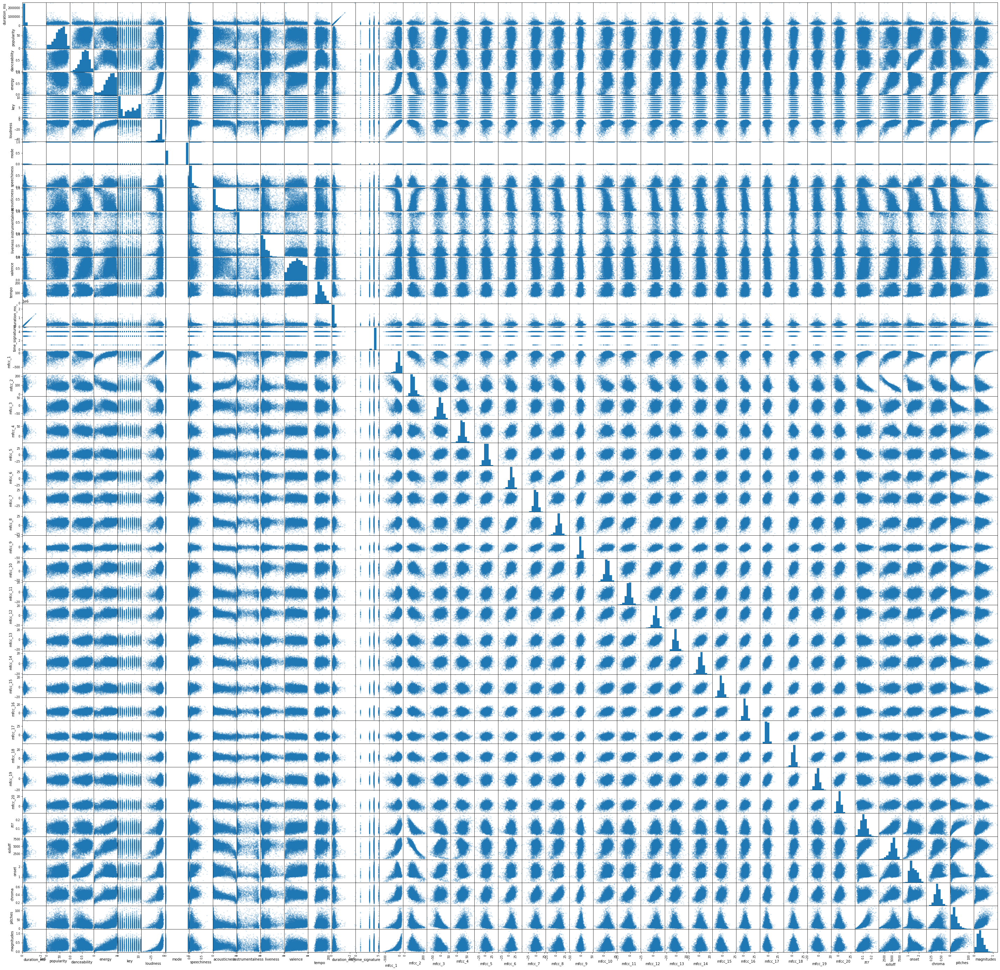

In [16]:
pd.plotting.scatter_matrix(saved_songs_df, alpha=0.2, figsize=(50,50))


In [18]:
# Creating the df with columns of interest
feature_names = ['danceability','energy','key','loudness','mode','speechiness','acousticness',
                      'instrumentalness','liveness','valence','tempo', 'duration_ms','time_signature', 
                      'mfcc_1', 'mfcc_2', 'mfcc_3', 'mfcc_4', 'mfcc_5', 'mfcc_6', 'mfcc_7', 'mfcc_8',
                      'mfcc_9', 'mfcc_10', 'mfcc_11', 'mfcc_12', 'mfcc_13', 'mfcc_14', 'mfcc_15', 'mfcc_16', 
                      'mfcc_17', 'mfcc_18', 'mfcc_19', 'mfcc_20', 'rolloff','onset', 'chroma', 'pitches', 
                      'magnitudes']
df = saved_songs_df[feature_names]
df.head()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,...,mfcc_16,mfcc_17,mfcc_18,mfcc_19,mfcc_20,rolloff,onset,chroma,pitches,magnitudes
0,0.584,0.110,3,-12.535,1,0.0376,0.90700,0.000003,0.1130,0.369,...,0.967129,-0.064558,-0.614783,-3.019311,-5.302307,3158.674615,1.326371,0.285964,12.766488,0.126560
1,0.644,0.537,2,-5.768,1,0.0763,0.82900,0.000000,0.3610,0.793,...,-1.329882,-5.179182,1.748319,-3.149593,2.127626,4549.920890,1.333204,0.308878,29.370230,0.298605
2,0.351,0.311,8,-13.927,1,0.0345,0.31900,0.126000,0.3130,0.221,...,8.245791,-10.501724,-2.382746,5.274812,4.494993,4996.959506,1.267091,0.372122,28.711487,0.138923
3,0.594,0.678,7,-11.415,1,0.0397,0.44900,0.000149,0.0833,0.730,...,-1.024126,-8.376709,-8.534555,-12.192015,-0.181445,3598.516082,1.195097,0.392091,25.993834,0.286376
4,0.285,0.979,11,-2.262,0,0.1290,0.00405,0.061000,0.2670,0.323,...,4.833520,1.256663,-1.059294,-1.699642,6.252073,4779.688821,1.204396,0.315525,49.203503,0.655956


In [19]:
# Scale all features
StdScaler = StandardScaler().fit_transform(df)

In [20]:
# Running PCA on the scaled features
pca = PCA(n_components = 5, random_state = 0).fit(StdScaler)

In [21]:
# Calculating variance for each principal component
singularValues = pca.singular_values_
variance = np.square(singularValues)/(len(StdScaler)-1)
variance

array([8.52609012, 4.73438824, 3.10131769, 1.83438517, 1.35529664])

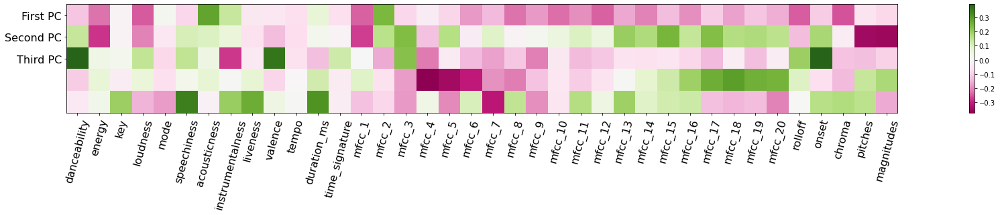

In [22]:
# plot Principal Components to discover what features contain the highest variability
def plot_pca_heatmap(pca, feature_names):
    pc_names = ['First PC', 'Second PC', 'Third PC']
    fig, ax = plt.subplots(figsize=(len(feature_names), 3))
    plt.imshow(pca.components_, interpolation = 'none', cmap = 'PiYG')
    feature_names=list(feature_names)
    plt.xticks(np.arange(0, len(feature_names), 1) , feature_names[:], rotation = 75, fontsize=16)
    plt.yticks(np.arange(0.0, 3, 1), pc_names, fontsize = 16)
    plt.colorbar()



plot_pca_heatmap(pca, feature_names)

<Figure size 432x288 with 0 Axes>

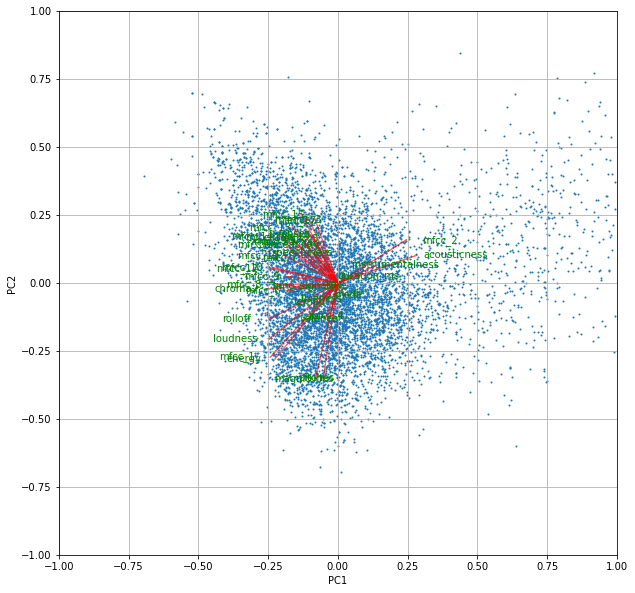

In [23]:
def biplot(score, coeff, maxdim, pcax, pcay, labels=None):
    pca1=pcax-1
    pca2=pcay-1
    xs = score[:,pca1]
    ys = score[:,pca2]
    n = min(coeff.shape[0], maxdim)
    scalex = 2.0/(xs.max()- xs.min())
    scaley = 2.0/(ys.max()- ys.min())
    text_scale_factor = 1.5
    plt.scatter(xs*scalex, ys*scaley, s=1)
    for i in range(n):
        plt.arrow(0, 0, coeff[i,pca1], coeff[i,pca2],color='r',alpha=0.5) 
        if labels is None:
            plt.text(coeff[i,pca1]* text_scale_factor, coeff[i,pca2] * text_scale_factor, "Var"+str(i+1), color='g', ha='center', va='center')
        else:
            plt.text(coeff[i,pca1]* text_scale_factor, coeff[i,pca2], labels[i], color='g', ha='center', va='center')
    plt.xlim(-1,1)
    plt.ylim(-1,1)
    plt.xlabel("PC{}".format(pcax))
    plt.ylabel("PC{}".format(pcay))
    plt.grid()

plt.figure()
plt.figure(figsize=(10, 10))

# Uncomment this code to generate the biplot using your previous answers
X_normalized = StdScaler
X_pca = pca.transform(X_normalized)
biplot(X_pca, np.transpose(pca.components_[0:2, :]), len(feature_names), 1, 2, labels=feature_names[:])

In [24]:
# Compute PCA, TSNE and MDS with 2 components to visualize any potencial clusters after transformation
print('iniciando')
X_pca = PCA(n_components = 2).fit_transform(StdScaler)
print('PCA Done')
X_tsne = TSNE(n_components = 2, random_state = 42).fit_transform(StdScaler)
print('T-SNE Done')
X_mds = MDS(n_components = 2, random_state = 42).fit_transform(StdScaler)
print('MDS Done')

iniciando
PCA Done
T-SNE Done
MDS Done


### From these plots, we can see that PCA is not outputting defined clusters so probably it is not a good idea to use the output of PCA as input for a cluster.
### TSNE on the contrary it is showing cluster formation, using TSNE as visualization after clustering will be prefered.  
### Note that the output from TSNE will not be used for clustering due to TSNE does not preserve distances nor density.

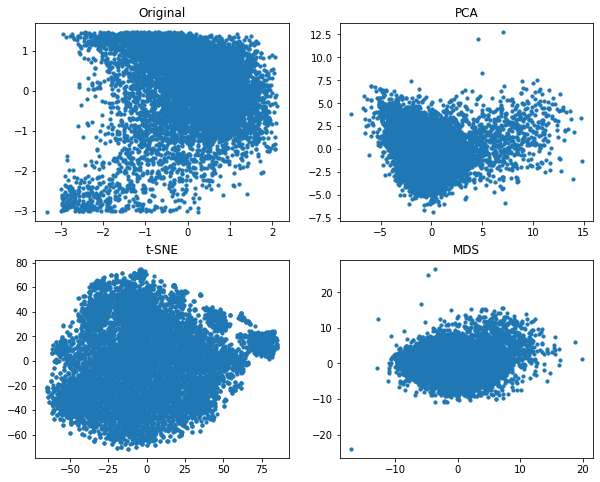

In [25]:
# From these plots, we can see that PCA is not outputting defined clusters so probably it is not a good idea
# to use the output of PCA as input for a cluster.
# TSNE on the contrary it is 


fig, axes = plt.subplots(2, 2, figsize=(10, 8))

axes[0, 0].scatter(StdScaler[:, 0], StdScaler[:, 1], s=10)
axes[0, 1].scatter(X_pca[:, 0], X_pca[:, 1], s=10)
axes[1, 0].scatter(X_tsne[:, 0], X_tsne[:, 1], s=10)
axes[1, 1].scatter(X_mds[:, 0], X_mds[:, 1], s=10)

axes[0, 0].set_title("Original")
axes[0, 1].set_title("PCA")
axes[1, 0].set_title("t-SNE")
axes[1, 1].set_title("MDS")
del fig, axes

In [26]:
# # get index from songs given X and Y coordinates on t-SNE
# songs_index = (np.where((X_tsne[:,0] <= -20) & (X_tsne[:,1] >= 15)))
# saved_songs_df.iloc[songs_index]

# Scale features and prepare data for clustering models

In [27]:
# Scale features and overwrite dataframe data for ease of exploring data
df[feature_names] = StandardScaler().fit_transform(df[feature_names])
df.head()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,...,mfcc_16,mfcc_17,mfcc_18,mfcc_19,mfcc_20,rolloff,onset,chroma,pitches,magnitudes
0,-0.060016,-2.524330,-0.642305,-1.112602,0.800969,-0.619939,2.444856,-0.370019,-0.493565,-0.599749,...,-0.505115,1.055332,-0.947928,-0.067888,-1.933392,-1.715724,-0.415180,-1.665972,-0.758494,-1.274948
1,0.276233,-0.606417,-0.921300,0.345643,0.800969,-0.188539,2.163719,-0.370031,1.130980,1.080841,...,-1.101655,-0.286733,-0.284599,-0.104541,0.066420,-0.484159,-0.394746,-1.330135,0.224813,-0.194346
2,-1.365783,-1.621518,0.752673,-1.412569,0.800969,-0.654496,0.325514,0.174456,0.816552,-1.186370,...,1.385174,-1.683355,-1.444200,2.265530,0.703611,-0.088430,-0.592446,-0.403219,0.185801,-1.197293
3,-0.003975,0.026899,0.473678,-0.871249,0.800969,-0.596530,0.794076,-0.369387,-0.688118,0.831130,...,-1.022250,-1.125756,-3.171029,-2.648480,-0.555081,-1.326366,-0.807730,-0.110543,0.024856,-0.271159
4,-1.735656,1.378871,1.589660,1.101163,-1.248488,0.398924,-0.809668,-0.106430,0.515225,-0.782077,...,0.498997,1.402017,-1.072703,0.303380,1.176540,-0.280763,-0.779924,-1.232721,1.399380,2.050139


In [28]:
# Apply PCA to scaled data and create df
df_pca = pd.DataFrame(PCA(n_components = 2).fit_transform(StdScaler),columns=['PC1','PC2']) 
df_pca.head()

,PC1,PC2
0,6.929969,1.393561
1,3.417432,-1.508948
2,1.502559,0.441493
3,4.229323,-2.634790
4,-0.590568,-2.985509


In [29]:
# Apply TSNE to scaled data and create df
df_tsne = pd.DataFrame(TSNE(n_components = 2).fit_transform(StdScaler),columns=['X','Y']) 
df_tsne.head()

,X,Y
0,63.213657,8.918883
1,51.981567,0.642623
2,37.057468,-49.176952
3,54.701717,2.260655
4,-24.569950,-47.938385


In [30]:
# Apply MDS to scaled data and create df
df_mds = pd.DataFrame(MDS(n_components = 2).fit_transform(StdScaler),columns=['X','Y']) 
df_mds.head()

,X,Y
0,-7.522150,4.590196
1,-5.335078,0.160016
2,-6.422647,-6.652250
3,-6.772791,-1.422495
4,-0.457202,-7.119035


In [31]:
# Build dataframe with info from all clusters
df_clusters = pd.DataFrame()
df_clusters[['PC1', 'PC2']] = df_pca[['PC1', 'PC2']]
df_clusters[['TSNE_X', 'TSNE_Y']] = df_tsne[['X','Y']]
df_clusters[['MDS_X', 'MDS_Y']] = df_mds[['X','Y']]
df_clusters.head()

,PC1,PC2,TSNE_X,TSNE_Y,MDS_X,MDS_Y
0,6.929969,1.393561,63.213657,8.918883,-7.522150,4.590196
1,3.417432,-1.508948,51.981567,0.642623,-5.335078,0.160016
2,1.502559,0.441493,37.057468,-49.176952,-6.422647,-6.652250
3,4.229323,-2.634790,54.701717,2.260655,-6.772791,-1.422495
4,-0.590568,-2.985509,-24.569950,-47.938385,-0.457202,-7.119035


# The following cell will show different cluster algorithms on the scaled data itself or on the output from PCA.
# We are going to focus our clustering with 3 main methods: KMeans as a baseline, Birch and Agglomerative.

### First we are going to use the elbow method to find what is the optimal number of clusters (K) to use.
### From the graph below, there is no clear elbow point but probably k=5 might be a good start

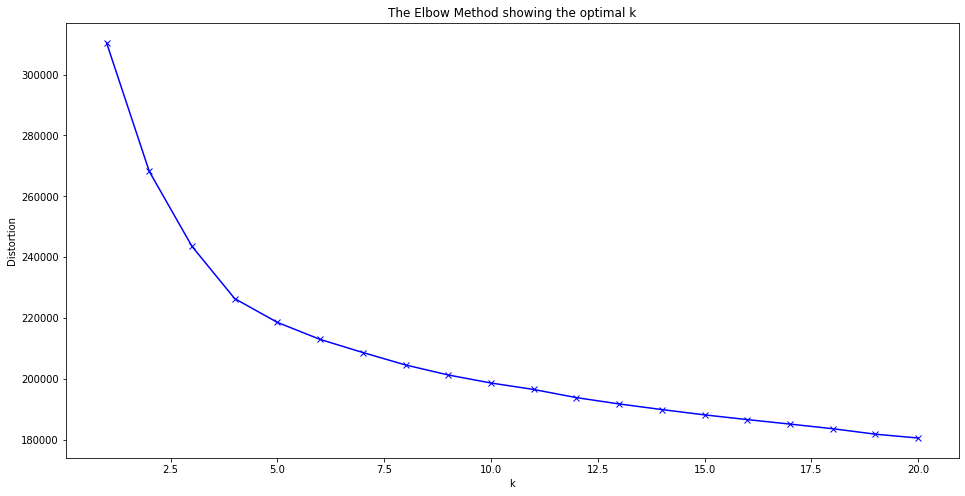

In [32]:
distortions = []
K = range(1,21)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(df)
    distortions.append(kmeanModel.inertia_)

plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [33]:
def single_model_and_plot(model, K, df, df_clusters, title, random_state=0):
    try:
        clustering = model(n_clusters=K, random_state=random_state).fit(df)
    except TypeError:
        clustering = model(n_clusters=K).fit(df)
    df_clusters['cluster'] = pd.Categorical(clustering.labels_)
    
    fig, axs = plt.subplots(ncols=2, nrows=2, figsize=(15,10))
    
    gpca = sns.scatterplot(x='PC1', y='PC2', hue='cluster', data=df_clusters, ax=axs[0,0])
    gtsne = sns.scatterplot(x='TSNE_X', y='TSNE_Y', hue='cluster', style='cluster', data=df_clusters, ax=axs[0,1], s=80)
    gmds = sns.scatterplot(x='MDS_X', y='MDS_Y', hue='cluster', style='cluster', data=df_clusters, ax=axs[1,0], s=80)

    gpca.legend(bbox_to_anchor=(1, 1))
    gtsne.legend(bbox_to_anchor=(1, 1))
    gmds.legend(bbox_to_anchor=(1, 1))

    gpca.set_title('PCA')
    gtsne.set_title('T-SNE')
    gmds.set_title('MDS')
    fig.suptitle('{} with {}'.format(title, clustering), fontsize=16)
    plt.show()

### As expected, clustering after PCA is not giving us meaningful clusters due to PCA itslef is not providing any separation in cluster. 
### Clusters seem to be defined enough but the clusters itself are not carrying any similarities between each other. They are following the KMeans algorithm where it is dividing the data equally to find the 15 clusters that was defined as an input.

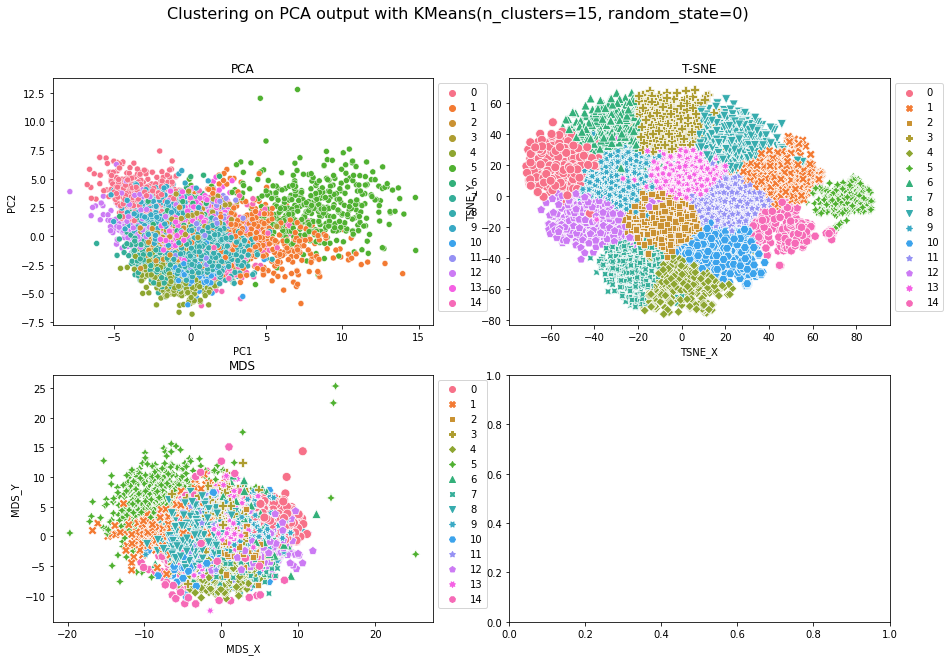

In [45]:
single_model_and_plot(KMeans, K=15, df=X_tsne, df_clusters=df_clusters, title='Clustering on PCA output')

### Clustering with KMeans and then visualizing on PCA shows that the clusters are blury and not well defined plus there are many overlaps, this is not showing a good clustering of our data.

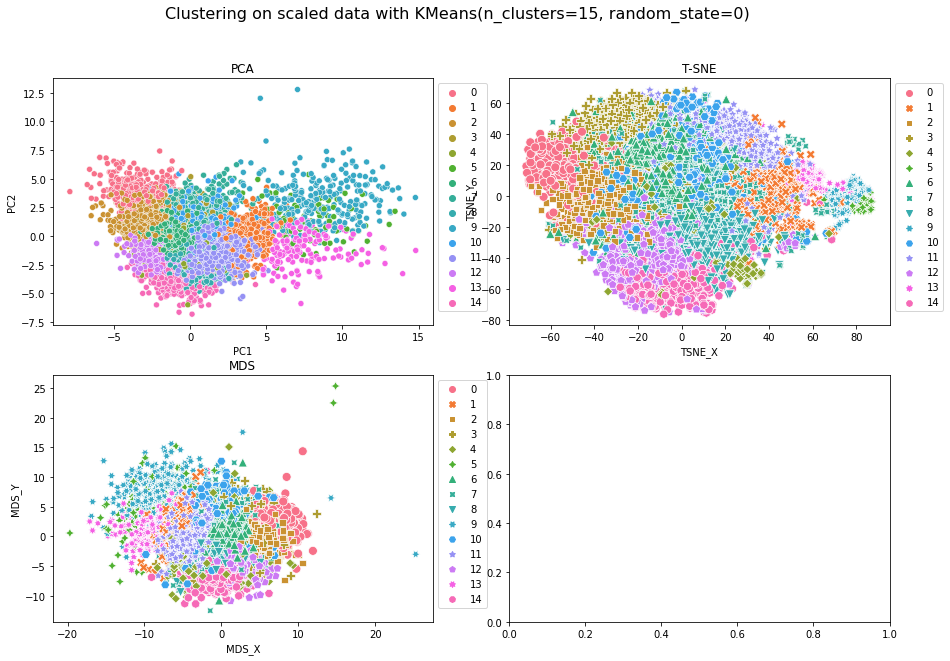

In [35]:
single_model_and_plot(KMeans, K=15, df=df, df_clusters=df_clusters, title='Clustering on scaled data')

### Clustering with KMeans with only those features with highest variability from PCA

### By only using the featues with highest variance from each principal component seem to be losing too much information and bluring even more the clusters

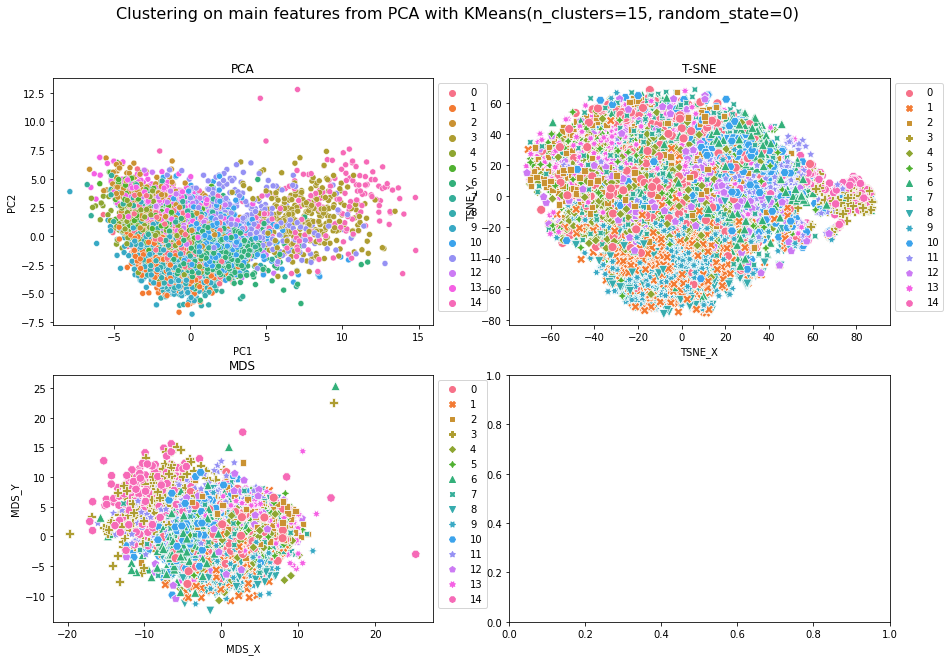

In [36]:
single_model_and_plot(KMeans, K=15, df=df[['acousticness', 'energy', 'danceability', 'mfcc_4', 'mfcc_5', 'key']], 
                      df_clusters=df_clusters, title='Clustering on main features from PCA')

### Using Agglomerative Clustering and then visualizing on T-SNE is showing the best results on the data with more defined clusters.

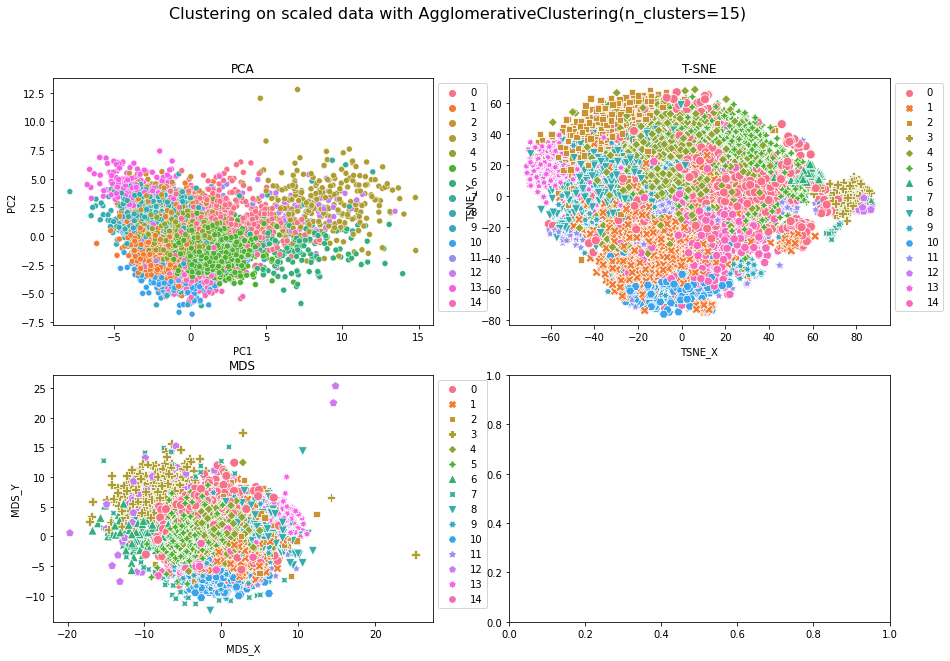

In [37]:
single_model_and_plot(AgglomerativeClustering, K=15, df=df, df_clusters=df_clusters, 
                      title='Clustering on scaled data', random_state=None)

### Birch algorithm is showing similar outputs as Agglomerative Cluster

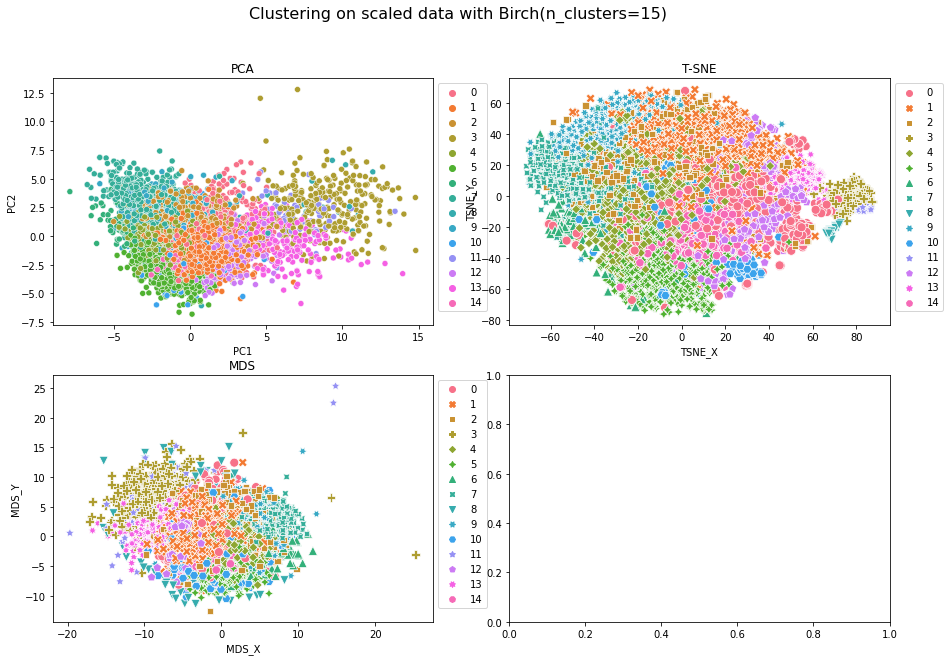

In [38]:
single_model_and_plot(Birch, K=15, df=df, df_clusters=df_clusters, 
                      title='Clustering on scaled data', random_state=None)

# KMeans, Agglomerative Cluster & Birch visualized on T-SNE

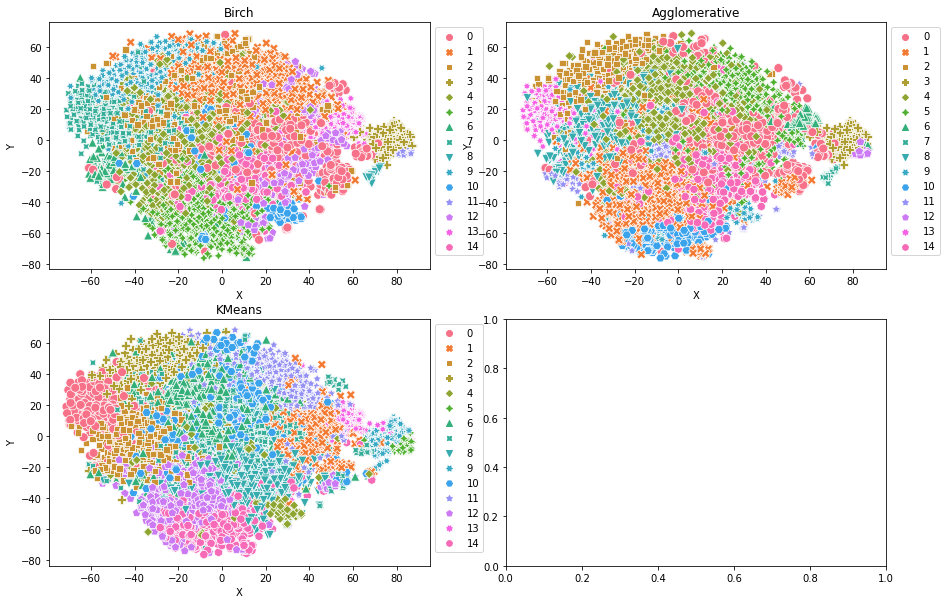

In [39]:
n_clusters = 15
clusteringBirch = Birch(n_clusters=n_clusters).fit(df)
clusteringAgglo = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward').fit(df)
kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(df)


df_tsne['clusterBirch'] = pd.Categorical(clusteringBirch.labels_)
df_tsne['clusterAgglo'] = pd.Categorical(clusteringAgglo.labels_)
df_tsne['clusterKmeans'] = pd.Categorical(kmeans.labels_)

fig, axs = plt.subplots(ncols=2, nrows=2, figsize=(15,10))

gpca = sns.scatterplot(x="X", y="Y", hue="clusterBirch", style="clusterBirch", data=df_tsne, ax=axs[0,0], s=80)
gtsne = sns.scatterplot(x="X", y="Y", hue="clusterAgglo", style="clusterAgglo", data=df_tsne, ax=axs[0,1], s=80)
gmds = sns.scatterplot(x="X", y="Y", hue="clusterKmeans", style="clusterKmeans", data=df_tsne, ax=axs[1,0], s=80)

gpca.legend(bbox_to_anchor=(1, 1))
gtsne.legend(bbox_to_anchor=(1, 1))
gmds.legend(bbox_to_anchor=(1, 1))

gpca.set_title('Birch')
gtsne.set_title('Agglomerative')
gmds.set_title('KMeans')

plt.show()

# Score metrics are OK but I think they can be improved, need to work on making the clusters more apart from each other.  how?  Clean the data a little bit more? Get more features from librosa? After adding lyrics?

In [44]:
def CH_DB_Scores(model, df, max_K, title, random_state=0):
    scoreCH = []
    scoreDB = []
    range_n_clusters = list(range(2,max_K+1))
    for n_clusters in range_n_clusters:
        try:
            clustering = model(n_clusters=n_clusters, random_state=random_state).fit(df)
        except TypeError:
            clustering = model(n_clusters=n_clusters).fit(df)
            
        scoreCH.append(calinski_harabasz_score(df, clustering.labels_))
        scoreDB.append(davies_bouldin_score(df, clustering.labels_))
        
    df = pd.DataFrame({'scoreCH':scoreCH, 'scoreDB':scoreDB, 'k':range_n_clusters})
    
    fig, axs = plt.subplots(ncols=2, figsize=(15,5))
    
    gch = sns.lineplot(x='k', y='scoreCH', data=df, ax=axs[0],marker="o").set_title('Calinski-Harabasz Score')
    gdb = sns.lineplot(x='k', y='scoreDB', data=df, ax=axs[1],marker="o").set_title('Davies-Bouldin Score')
    fig.suptitle('{} with {}'.format(title, clustering), fontsize=16)
    plt.show()
    
        

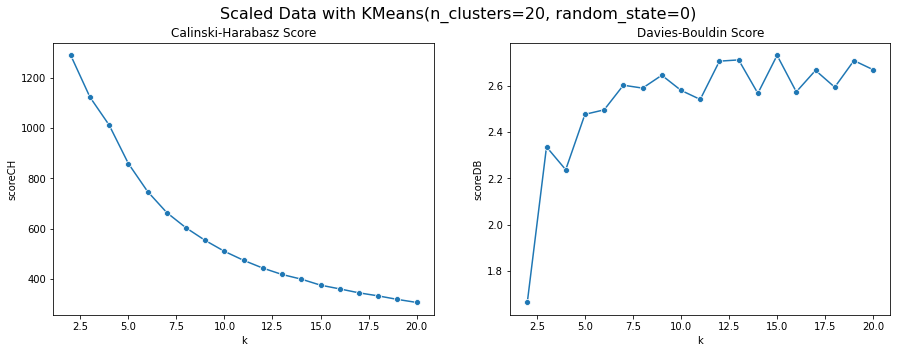

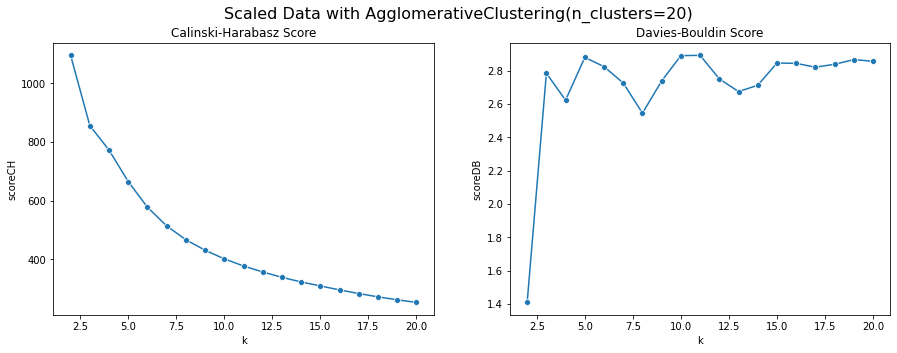

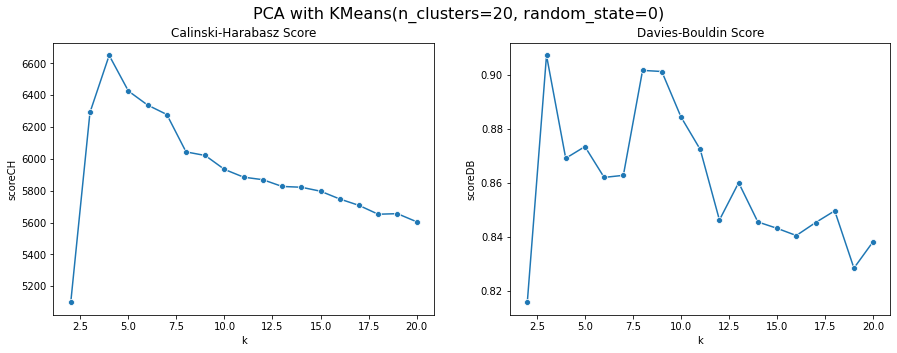

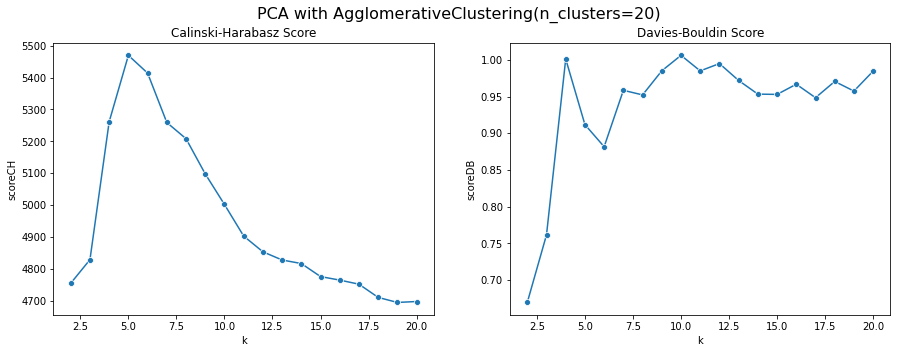

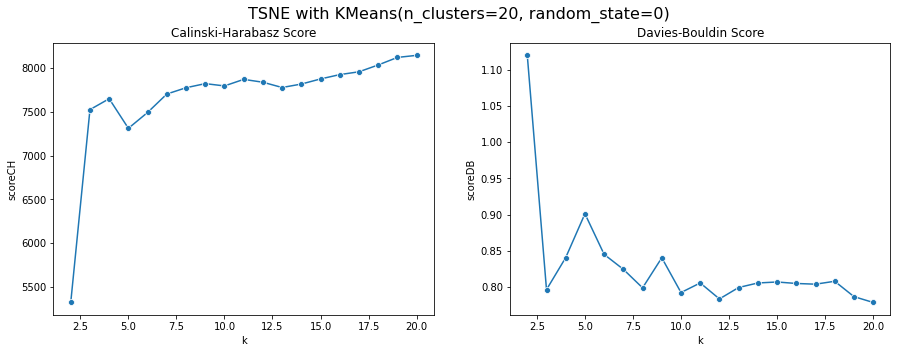

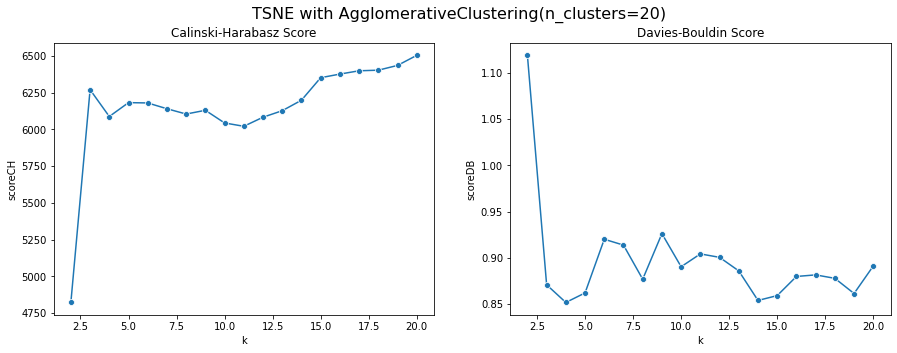

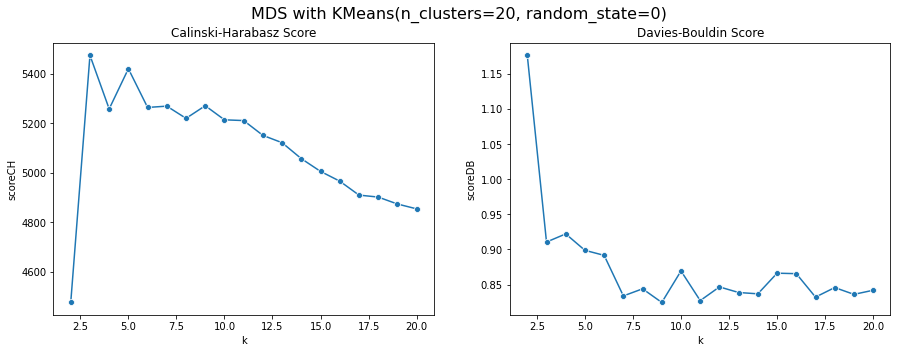

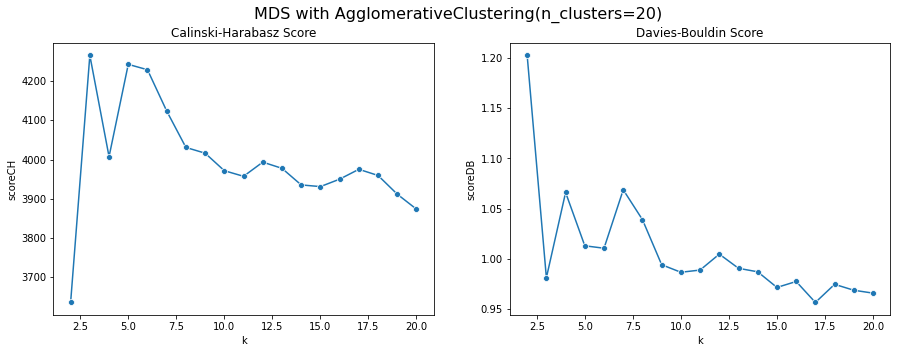

In [41]:
# data = [df,X_pca,X_tsne,X_mds]
data = [(df,'Scaled Data'), (X_pca,'PCA'), (X_tsne,'TSNE'), (X_mds,'MDS')]
for d,t in data:
    CH_DB_Scores(KMeans, d, max_K=20, title=t)
    CH_DB_Scores(AgglomerativeClustering, d, max_K=20, title=t)

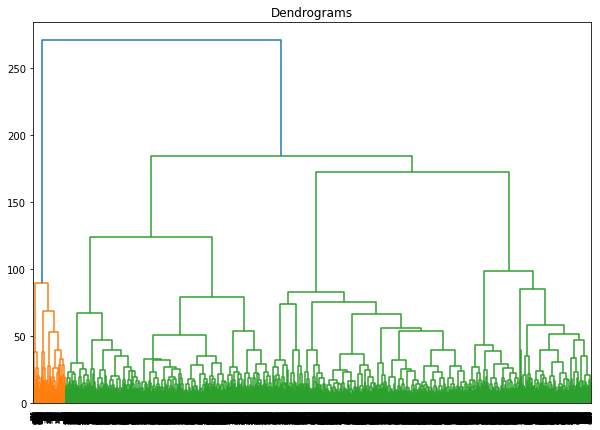

In [42]:
import scipy.cluster.hierarchy as shc
plt.figure(figsize=(10, 7))  
plt.title("Dendrograms")  
dend = shc.dendrogram(shc.linkage(df, method='ward'))

In [46]:
df

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,...,mfcc_16,mfcc_17,mfcc_18,mfcc_19,mfcc_20,rolloff,onset,chroma,pitches,magnitudes
0,-0.060016,-2.524330,-0.642305,-1.112602,0.800969,-0.619939,2.444856,-0.370019,-0.493565,-0.599749,...,-0.505115,1.055332,-0.947928,-0.067888,-1.933392,-1.715724,-0.415180,-1.665972,-0.758494,-1.274948
1,0.276233,-0.606417,-0.921300,0.345643,0.800969,-0.188539,2.163719,-0.370031,1.130980,1.080841,...,-1.101655,-0.286733,-0.284599,-0.104541,0.066420,-0.484159,-0.394746,-1.330135,0.224813,-0.194346
2,-1.365783,-1.621518,0.752673,-1.412569,0.800969,-0.654496,0.325514,0.174456,0.816552,-1.186370,...,1.385174,-1.683355,-1.444200,2.265530,0.703611,-0.088430,-0.592446,-0.403219,0.185801,-1.197293
3,-0.003975,0.026899,0.473678,-0.871249,0.800969,-0.596530,0.794076,-0.369387,-0.688118,0.831130,...,-1.022250,-1.125756,-3.171029,-2.648480,-0.555081,-1.326366,-0.807730,-0.110543,0.024856,-0.271159
4,-1.735656,1.378871,1.589660,1.101163,-1.248488,0.398924,-0.809668,-0.106430,0.515225,-0.782077,...,0.498997,1.402017,-1.072703,0.303380,1.176540,-0.280763,-0.779924,-1.232721,1.399380,2.050139
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8165,-0.233745,1.167766,1.031669,0.579453,-1.248488,0.320893,0.729198,-0.370031,3.692260,0.601238,...,-0.321994,-0.354446,-1.096806,-1.368592,0.157346,0.407720,-0.338100,-0.054165,0.385482,1.360475
8166,0.360295,0.696148,-0.084313,0.258152,-1.248488,-0.595415,1.489710,-0.369994,1.261992,1.611971,...,-0.217696,-1.964886,-0.439373,-0.253620,-0.871449,0.554498,1.219744,-0.707491,0.196029,-0.442615
8167,-0.984701,-0.799555,-0.363309,0.018524,-1.248488,-0.561973,1.320307,-0.370031,0.351460,-0.900987,...,-0.368083,-0.628582,0.456587,-0.090612,0.676617,-0.897367,-0.867213,-0.461539,0.319266,1.497917
8168,1.172896,-0.503110,-1.200296,0.099118,-1.248488,-0.596530,0.675133,-0.370031,-0.835506,0.981749,...,-0.907258,-0.435906,1.973622,0.658427,0.513028,1.307937,1.404307,-1.275315,-0.286171,-0.195810


In [47]:
df_tsne

,X,Y,clusterBirch,clusterAgglo,clusterKmeans
0,63.213657,8.918883,3,3,13
1,51.981567,0.642623,12,5,1
2,37.057468,-49.176952,0,11,7
3,54.701717,2.260655,12,5,1
4,-24.569950,-47.938385,12,14,14
...,...,...,...,...,...
8165,26.802725,-45.026089,10,9,4
8166,26.314724,36.457676,1,5,11
8167,35.282215,-26.424204,12,14,8
8168,15.708398,57.483826,1,5,10


In [48]:
saved_songs_df

,song_name,song_id,song_genre,url,artist,artist_id,artist_genre,release_date,duration_ms,popularity,...,mfcc_17,mfcc_18,mfcc_19,mfcc_20,zcr,rolloff,onset,chroma,pitches,magnitudes
0,Come Back Baby,48al0wZBGItngZQZED80WO,blues,https://open.spotify.com/track/48al0wZBGItngZQ...,Ray Charles,1eYhYunlNJlDoQhtYBvPsi,"['adult standards', 'classic soul', 'jazz blue...",1957-01-01,186639,34,...,-0.064558,-0.614783,-3.019311,-5.302307,0.077160,3158.674615,1.326371,0.285964,12.766488,0.126560
1,Bad Luck,6qrnUwHfWubFB8tdvrAsby,blues,https://open.spotify.com/track/6qrnUwHfWubFB8t...,B.B. King,5xLSa7l4IV1gsQfhAMvl0U,"['blues', 'blues rock', 'classic rock', 'elect...",2008-08-18,174666,7,...,-5.179182,1.748319,-3.149593,2.127626,0.118539,4549.920890,1.333204,0.308878,29.370230,0.298605
2,"Lenny - Live at The Spectrum, Montreal; Augusy...",5w8Ti9LEgtN2wXnJ4W4qpI,blues,https://open.spotify.com/track/5w8Ti9LEgtN2wXn...,Stevie Ray Vaughan,5fsDcuclIe8ZiBD5P787K1,"['album rock', 'blues', 'blues rock', 'classic...",1984,667200,25,...,-10.501724,-2.382746,5.274812,4.494993,0.140973,4996.959506,1.267091,0.372122,28.711487,0.138923
3,Badge,4a7Xu1edRTAGhjScmeGsUF,blues,https://open.spotify.com/track/4a7Xu1edRTAGhjS...,Cream,74oJ4qxwOZvX6oSsu1DGnw,"['album rock', 'art rock', 'blues rock', 'clas...",2005-01-01,165346,24,...,-8.376709,-8.534555,-12.192015,-0.181445,0.094115,3598.516082,1.195097,0.392091,25.993834,0.286376
4,When My Train Pulls In,2mdxGlwrhtkuxgzbH7LOIh,blues,https://open.spotify.com/track/2mdxGlwrhtkuxgz...,Gary Clark Jr.,01aC2ikO4Xgb2LUpf9JfKp,"['blues rock', 'electric blues', 'funk', 'mode...",2012-10-22,465960,42,...,1.256663,-1.059294,-1.699642,6.252073,0.148677,4779.688821,1.204396,0.315525,49.203503,0.655956
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8165,Pégate (MTV Unplugged Version)[Radio Edit],6derJzyW5gcu125FpbsReh,salsa,https://open.spotify.com/track/6derJzyW5gcu125...,Ricky Martin,7slfeZO9LsJbWgpkIoXBUJ,"['dance pop', 'latin', 'latin pop', 'mexican p...",2006-11-01,245026,57,...,-5.437239,-1.145159,-7.642657,2.465448,0.115705,5557.438497,1.352147,0.395938,32.083218,0.546153
8166,No Me Acostumbro,4SjBGbtJz77ximBiOZcIn6,salsa,https://open.spotify.com/track/4SjBGbtJz77ximB...,Rey Ruiz,1S0uvW1rgvtkNGma9su3fJ,"['latin', 'salsa', 'tropical']",1992,289586,60,...,-11.574643,1.196936,-3.679496,-1.356853,0.124925,5723.247489,1.873112,0.351361,28.884197,0.259078
8167,Abrázame Muy Fuerte,4gTxKZH5RERMhX9H8EnPAX,salsa,https://open.spotify.com/track/4gTxKZH5RERMhX9...,Marc Anthony,4wLXwxDeWQ8mtUIRPxGiD6,"['latin', 'latin pop', 'modern salsa', 'salsa'...",2010-05-24,274680,56,...,-6.481972,4.388783,-3.100084,4.394702,0.100437,4083.137958,1.175205,0.368143,30.965120,0.568035
8168,Obsesion,65H6t1WQBim6q93yM8fEwn,salsa,https://open.spotify.com/track/65H6t1WQBim6q93...,"['Aventura', 'Judy Santos']","['1qto4hHid1P71emI6Fd8xi', '1seU2dut8PjGSZbgrP...","[['bachata', 'bachata dominicana', 'latin', 'l...",2002-06-01,254720,74,...,-5.747682,9.793204,-0.437627,3.786919,0.151165,6574.374800,1.934833,0.312619,20.741955,0.298372
